In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, Input
from tensorflow.keras.utils import load_img, img_to_array
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from google.colab.patches import cv2_imshow
import pandas
import numpy as np
import os
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

from google.colab.patches import cv2_imshow

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!pwd

/content


In [ ]:
train_dir = '/content/drive/Shared drives/vertani-datasets/SoilDetectionDataset/train'
validation_dir = '/content/drive/Shared drives/vertani-datasets/SoilDetectionDataset/validation'

In [ ]:
train_datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2
)

In [ ]:
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(150, 150),
    batch_size=32,
    class_mode='binary',
    subset='training'
)

validation_generator = train_datagen.flow_from_directory(
    validation_dir,
    target_size=(150, 150),
    batch_size=32,
    class_mode='binary',
    subset='validation'
)

Found 273 images belonging to 2 classes.
Found 45 images belonging to 2 classes.


In [ ]:
model = Sequential([
    Input(shape=(150, 150, 3)),
    Conv2D(32, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),
    Flatten(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(1, activation='sigmoid')
])

model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

In [ ]:
history = model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=10,  # You can start with 10 epochs
    verbose=1
)

Epoch 1/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 48s 2s/step - accuracy: 0.5975 - loss: 1.4014 - val_accuracy: 0.2222 - val_loss: 1.1926
Epoch 2/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 38s 2s/step - accuracy: 0.7643 - loss: 0.5135 - val_accuracy: 0.2222 - val_loss: 0.8039
Epoch 3/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 42s 2s/step - accuracy: 0.7995 - loss: 0.3195 - val_accuracy: 0.2444 - val_loss: 0.7379
Epoch 4/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 40s 2s/step - accuracy: 0.8570 - loss: 0.2813 - val_accuracy: 0.9111 - val_loss: 0.4271
Epoch 5/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 42s 2s/step - accuracy: 0.9527 - loss: 0.1447 - val_accuracy: 0.9333 - val_loss: 0.2705
Epoch 6/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 42s 2s/step - accuracy: 0.9400 - loss: 0.1373 - val_accuracy: 0.8444 - val_loss: 0.6066
Epoch 7/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 38s 2s/step - accuracy: 0.9615 - loss: 0.1039 - val_accuracy: 0.7778 - val_loss: 0.6690
Epoch 8/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 42s 2s/step - accuracy: 0.9835 - loss: 0.0531 - val_accuracy: 0.8000 - val_loss: 0.6580
Epoch 9/

In [ ]:
loss, accuracy = model.evaluate(validation_generator)
print(f'Validation accuracy: {accuracy:.2f}')

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 143ms/step - accuracy: 0.8799 - loss: 0.6438
Validation accuracy: 0.87


In [ ]:
model.save('/content/drive/Shared drives/vertani-datasets/SoilDetectionDataset/soil_detection_model.h5')

In [ ]:
model = tf.keras.models.load_model('/content/drive/Shared drives/vertani-datasets/SoilDetectionDataset/soil_detection_model.h5')

In [ ]:
!ls "/content/drive/Shared drives/"

vertani-datasets


In [ ]:
img_path = '/content/drive/Shared drives/vertani-datasets/SoilDetectionDataset/taman/tamanSoily.jpg' # contoh foto (belum ada foto)
img = load_img(img_path, target_size=(150, 150)) # udh import image
img_array = img_to_array(img) / 255.0
img_array = np.expand_dims(img_array, axis=0)

In [ ]:
prediction = model.predict(img_array)
if prediction[0][0] > 0.5:  # Assuming sigmoid activation
    print("Soil detected!")
else:
    print("No Soil Detected!")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
Soil detected!


Percentage of soil area: 35.71%


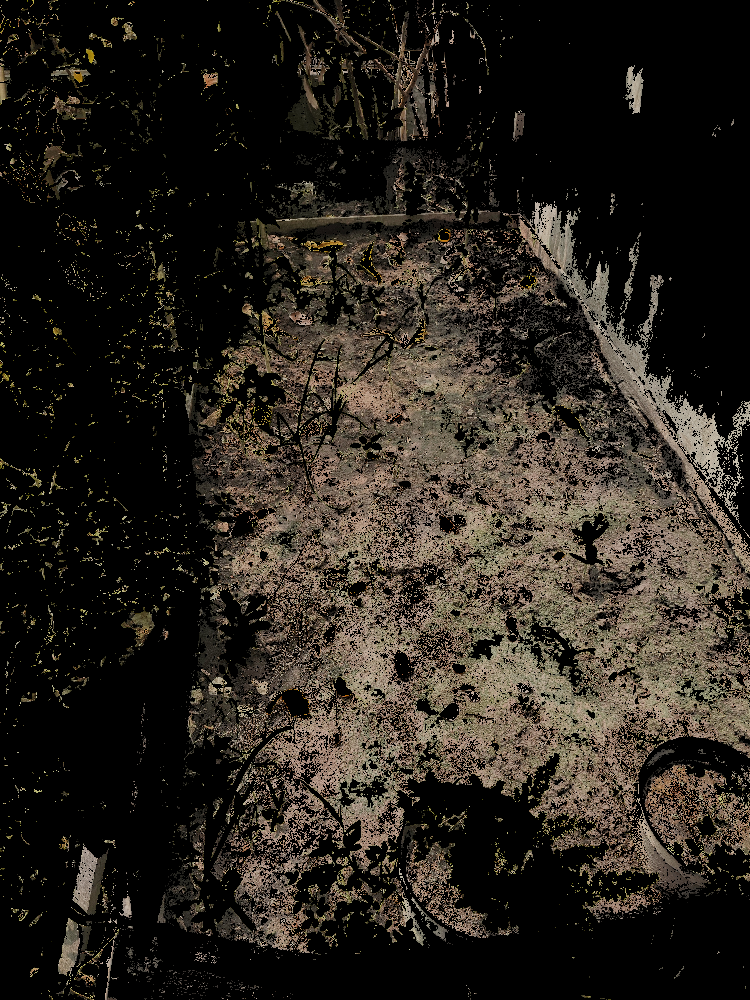

In [ ]:
original_img = cv2.imread(img_path)

hsv_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2HSV)

lower_bound = np.array([10, 30, 20])
upper_bound = np.array([30, 255, 200])

soil_mask = cv2.inRange(hsv_img, lower_bound, upper_bound)

soil_area = cv2.bitwise_and(original_img, original_img, mask=soil_mask)

soil_pixel_count = cv2.countNonZero(soil_mask)
total_pixel_count = soil_mask.size

soil_percentage = (soil_pixel_count / total_pixel_count) * 100
print(f"Percentage of soil area: {soil_percentage:.2f}%")

cv2_imshow(soil_area)
cv2.waitKey(0)
cv2.destroyAllWindows()